In [1]:
cd((@__DIR__) * raw"\..")
include("../table_reader.jl")
include("../utils/Missing_values.jl")

truncate_MV (generic function with 1 method)

In [2]:
series=extract_series("TX_STAID000031.txt",plot=false)
series=truncate_MV(series,"TX")
years=unique(Dates.year.(series.DATE))

include("../utils/Simulation.jl")
Days_list=GatherYearScenario(series[!,2],series.DATE)
avg_day=mean.(Days_list)
max_day=maximum.(Days_list)
df_month = @chain series begin
    @transform(:TEMP = series[!,2]) #Give a common name for TX, TN, etc...
    @transform(:MONTH = month.(:DATE)) #add month column
    @by(:MONTH, :MONTHLY_MEAN = mean(:TEMP), :MONTHLY_STD = std(:TEMP), :MONTHLY_MAX = maximum(:TEMP)) # grouby MONTH + takes the mean/std in each category 
end

#Imputing missing values
# include("utils/Missing_values.jl")
# ImputeMissingValues!(series[!,2],series.DATE)
# N=length(series[!,2])

Row,MONTH,MONTHLY_MEAN,MONTHLY_STD,MONTHLY_MAX
,Int64,Float64,Float64,Float64
1,1,1.17685,0.332309,2.12
2,2,1.28727,0.331852,2.27
3,3,1.54382,0.311683,2.61
4,4,1.79017,0.303244,2.62
5,5,2.19996,0.325811,3.19
6,6,2.54889,0.309155,3.6
7,7,2.85561,0.300014,4.06
8,8,2.80813,0.278482,3.64
9,9,2.47622,0.280431,3.3


## I. Series filtered by removing a trigonometric periodicity

In [3]:
include("../utils/periodicity.jl")
trigo_function=fitted_periodicity_fonc_stepwise(series[!,2],series.DATE)
periodicity=trigo_function.(series.DATE)
x=series[!,2]-periodicity
period=trigo_function.(Date(0):Date(1)-Day(1))

366-element Vector{Float64}:
 1.136017767774405
 1.133078943544328
 1.1319531804272327
 1.1314118199546193
 1.1307013014188458
 1.1299705850703683
 1.1299624100674373
 1.1312066384640862
 1.1333030874712802
 1.1348492494013942
 ⋮
 1.182307818355045
 1.1755025202631875
 1.1724356879910096
 1.1702286349678261
 1.1663355544685694
 1.159790922088079
 1.1514651264008031
 1.1433073539748901
 1.137114751667483

## Segmenting the dataset by month

In [4]:
include("../utils/Separation.jl")
Monthly_date=MonthlySeparateDates(series.DATE)
Monthly_temp=MonthlySeparateX(x,series.DATE)

12-element Vector{Vector{AbstractVector}}:
 [[0.14398223222559525, 0.2669210564556721, 0.3680468195727673, 0.0785881800453807, 0.1692986985811542, 0.3100294149296319, 0.2800375899325629, -0.1312066384640862, -0.34330308747128013, -0.05484924940139413  …  -0.5837422506805398, -0.6545393628771883, -0.3315742291746282, -0.05491866990702632, -0.363959770227403, -0.1280926394798796, 0.05216967657061544, 0.06443174299472476, 0.05462437525919239, 0.0782826414084512], [0.363982232225595, -0.103078943544328, -0.18195318042723263, -0.011411819954619373, -0.3207013014188458, -0.029970585070368205, 0.20003758993256282, 0.1187933615359138, -0.5133030874712801, -0.5348492494013941  …  0.2662577493194602, 0.4454606371228118, 0.2984257708253717, -0.0649186699070261, 0.1260402297725971, 0.0019073605201203048, 0.20216967657061558, 0.06443174299472476, 0.07462437525919219, -0.10171735859154896], [0.26398223222559514, 0.45692105645567205, 0.4480468195727674, 0.5685881800453809, 0.5892986985811541, 0.23002

## Autocorrelations

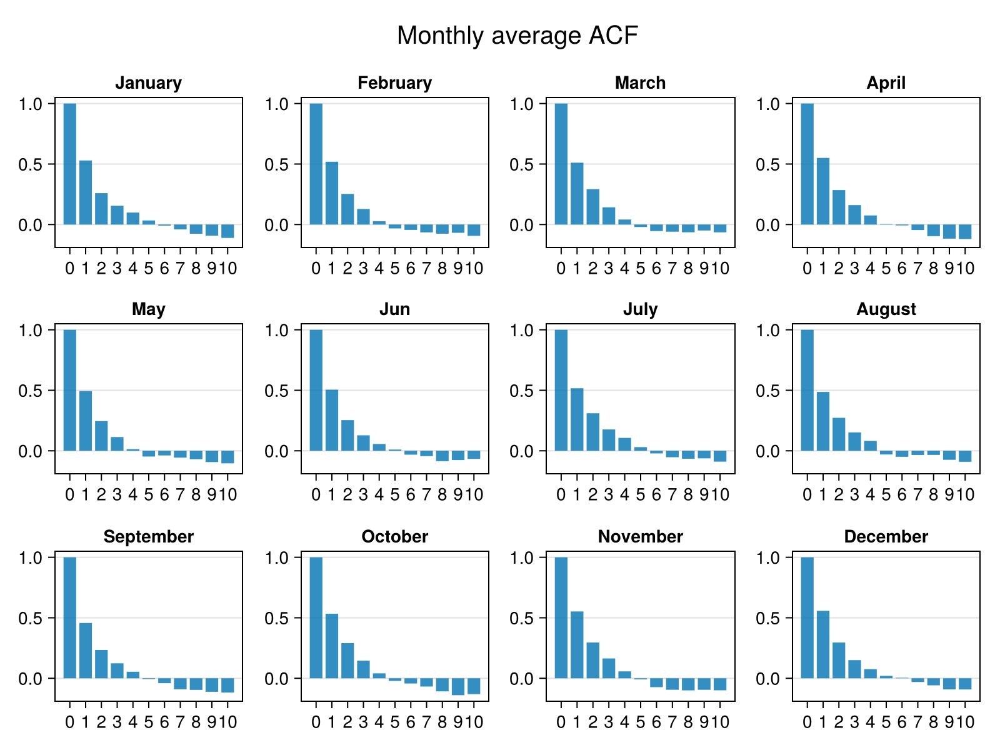

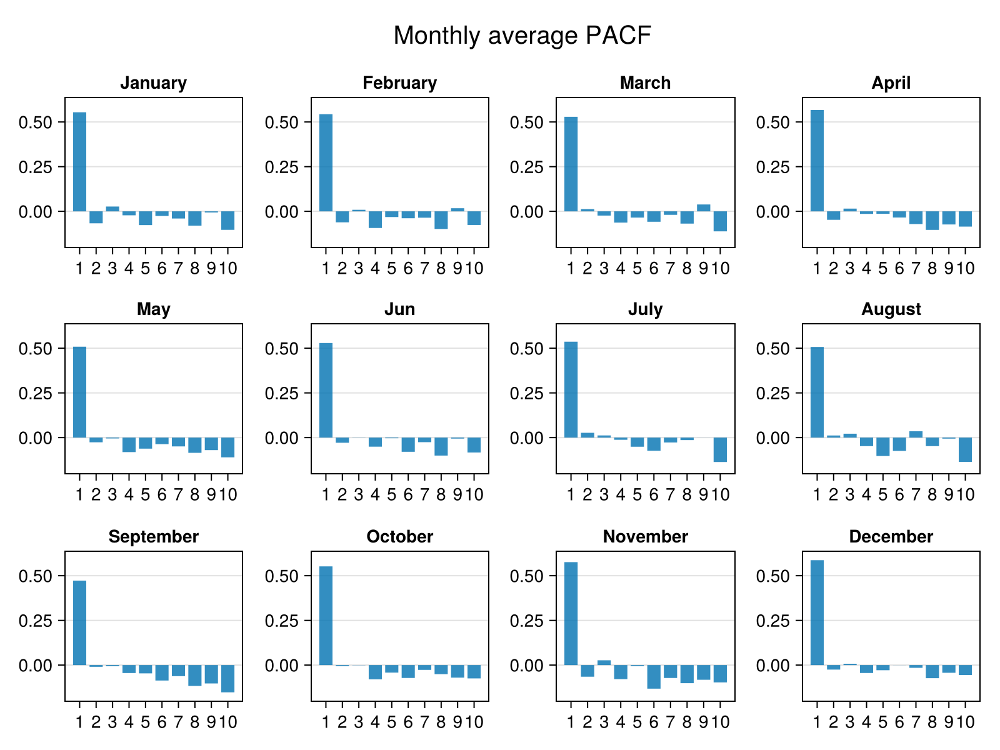

CairoMakie.Screen{IMAGE}


In [5]:
include("../utils/ACF_PACF.jl")
display(MonthlyACF(Monthly_temp))
display(MonthlyPACF(Monthly_temp))

For each month, it still looks like an AR(1) model

# Estimation AR(1)

## Estimation

ERROR: LoadError: too many parameters for type AbstractInterpolation
Stacktrace:
 [1] top-level scope
   @ C:\Users\goninarn\.julia\packages\SparseConnectivityTracer\litqn\ext\SparseConnectivityTracerDataInterpolationsExt.jl:28
 [2] include
   @ .\Base.jl:557 [inlined]
 [3] include_package_for_output(pkg::Base.PkgId, input::String, depot_path::Vector{String}, dl_load_path::Vector{String}, load_path::Vector{String}, concrete_deps::Vector{Pair{Base.PkgId, UInt128}}, source::String)
   @ Base .\loading.jl:2881
 [4] top-level scope
   @ stdin:6
in expression starting at C:\Users\goninarn\.julia\packages\SparseConnectivityTracer\litqn\ext\SparseConnectivityTracerDataInterpolationsExt.jl:3
in expression starting at stdin:6
┌ Error: Error during loading of extension SparseConnectivityTracerDataInterpolationsExt of SparseConnectivityTracer, use `Base.retry_load_extensions()` to retry.
│   exception = 1-element ExceptionStack:
Failed to precompile SparseConnectivityTracerDataInterpolationsExt [

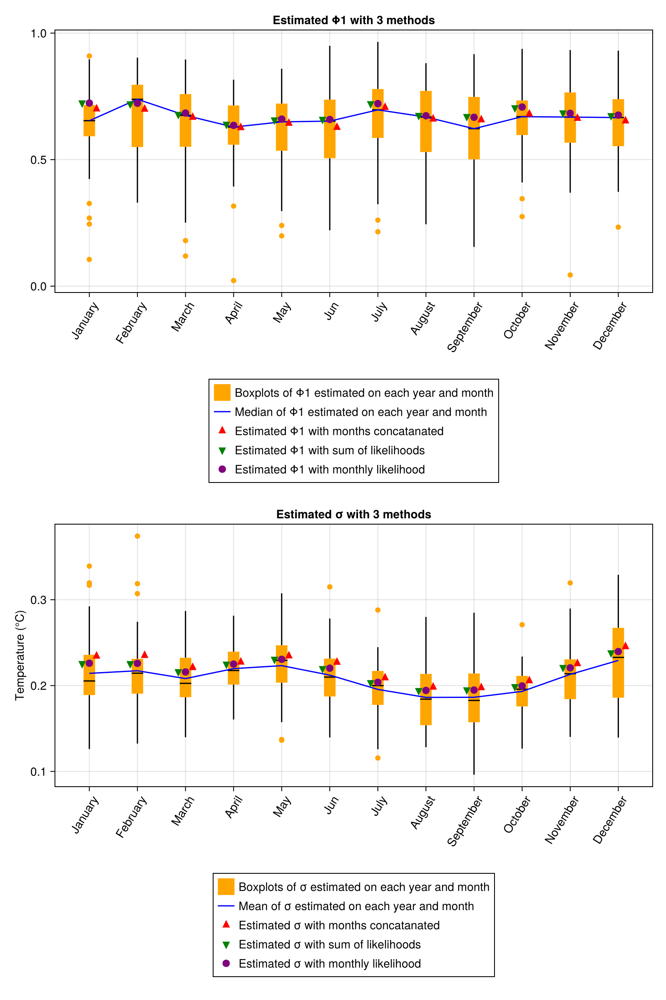

CairoMakie.Screen{IMAGE}


In [6]:
include(raw"..\utils\Estimation.jl")
Params, figure= AllEstimation(x, Date_vec = series.DATE, lineplot=true)
display(figure)

In [7]:
# include(raw"..\utils\Structure.jl")
# model_ = fit_MonthlyAR(series[:, 2], series.DATE)
# display(model_.Φ)
# display(model_.σ)
# model_.nspart == period

## Simulation

### With monthly likelihoods

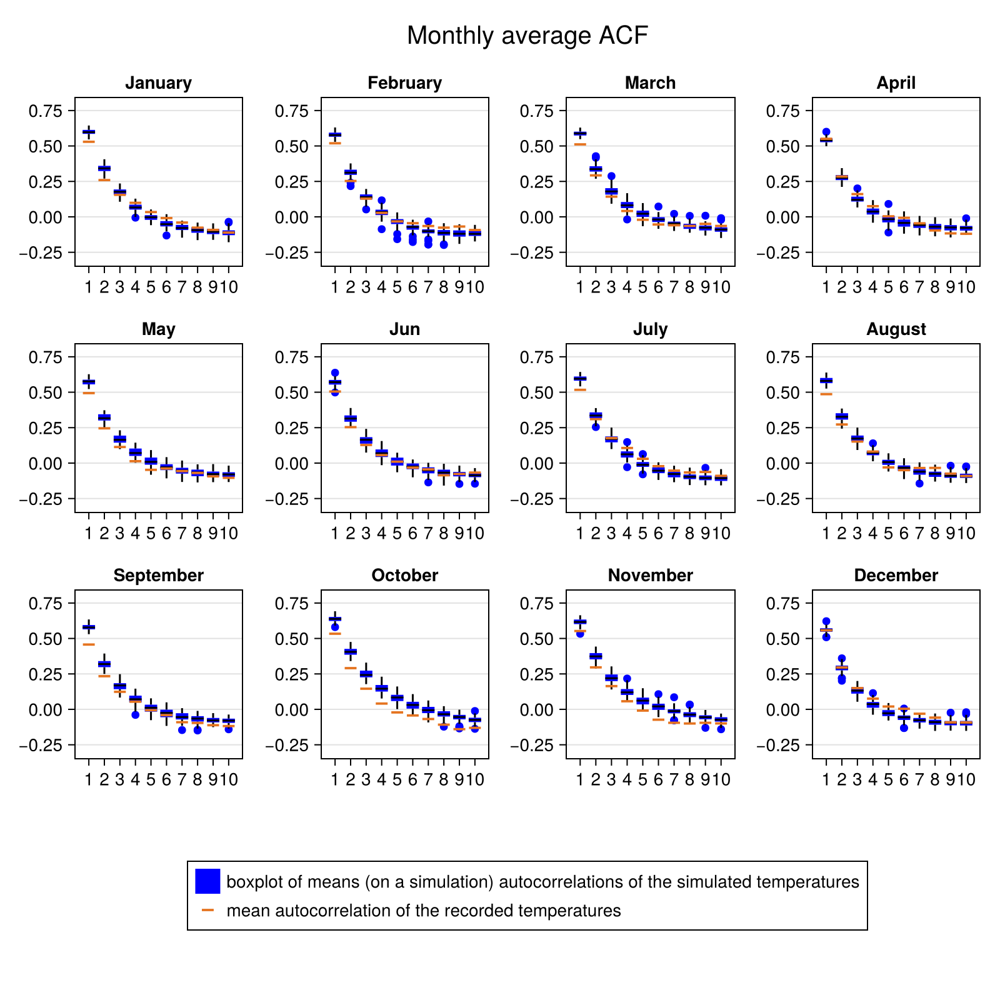

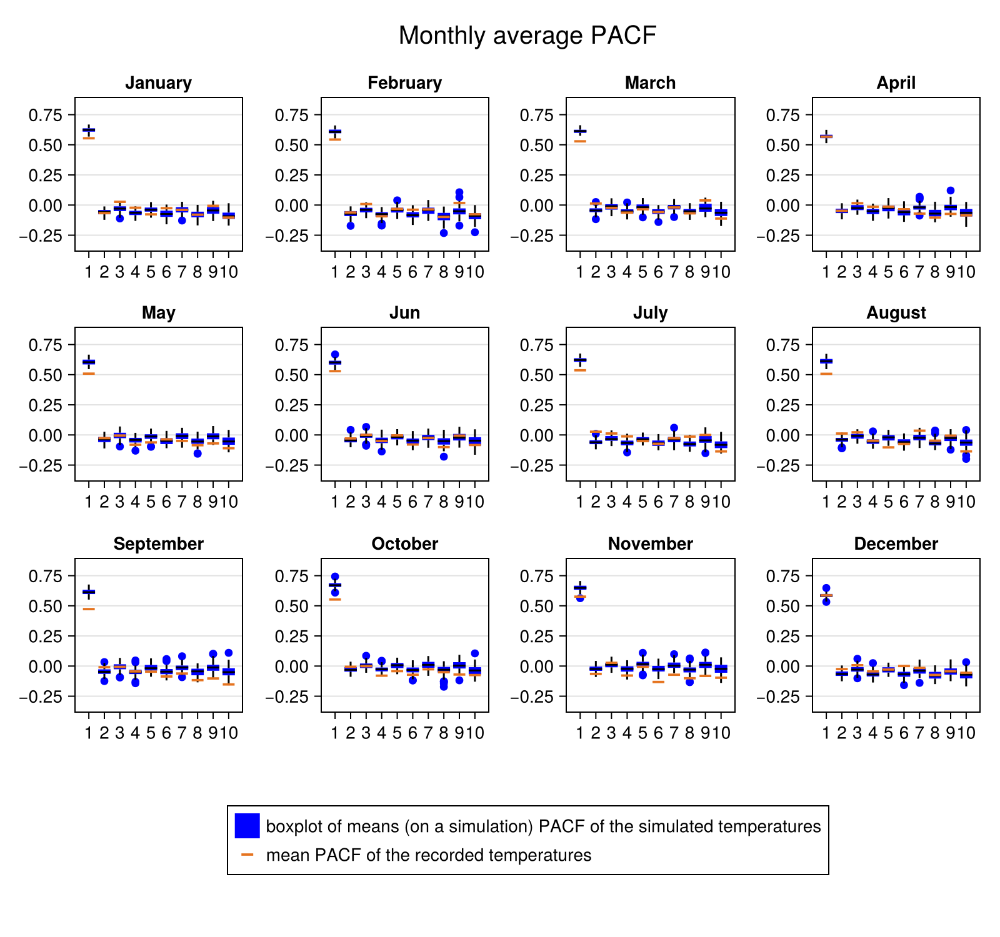

CairoMakie.Screen{IMAGE}


In [8]:
Φ_month_mean,σ_month_mean=TakeParameters(Params,"monthlyLL")
sample_ = SimulateScenarios(Monthly_temp[1][1][1],series.DATE[1]:series.DATE[end],Φ_month_mean,σ_month_mean,period,n=100)
year_sample = GatherYearScenarios(sample_,series.DATE[1]:series.DATE[end])
# display(PlotYearCurves([period,mean.(year_sample)],["Periodicity estimation","Mean simulated temperatures"],"Average daily temperature during a year (centered)"))
# display(PlotYearCurves([period,avg_day,max_day],
# ["Periodicity estimation","Average recorded temperatures","Maximum recorded temperatures","Simulated temperatures range","Simulated temperatures quantile interval, p ∈ [0.25,0.75]"],
# "Average daily temperature during a year (centered)",
# [(minimum.(year_sample),maximum.(year_sample)),(quantile.(year_sample,0.25),quantile.(year_sample,0.75))],
# [("#009bff",0.2),("#009bff",0.5)],
# colors=["blue","orange","red"]
# ))
# display(PlotYearCurves([maximum.(year_sample) .- minimum.(year_sample) , quantile.(year_sample,0.75) .- quantile.(year_sample,0.25)],
# ["Simulated temperatures range" ,"Simulated temperatures interquartile range, p ∈ [0.25,0.75]"],
# "Simulated temperatures interquartile range"
# ))
# display.(WrapPlotMonthlyStats(df_month, sample_, series.DATE[1]:series.DATE[end]))
display(Plot_Sample_MonthlyACF(sample_,series.DATE[1]:series.DATE[end],Monthly_temp))
display(Plot_Sample_MonthlyPACF(sample_,series.DATE[1]:series.DATE[end],Monthly_temp))

In [9]:
mean(Error_MonthlyACF(sample_,series.DATE[1]:series.DATE[end],Monthly_temp))

0.045412468962772894

In [10]:
MPACF=Error_MonthlyPACF(sample_,series.DATE[1]:series.DATE[end],Monthly_temp)
display(mean(MPACF[1,:]))
display(mean(MPACF[2,:]))

0.04122731548122298

0.04180110358154094

# Estimation AR(2)

## Estimation

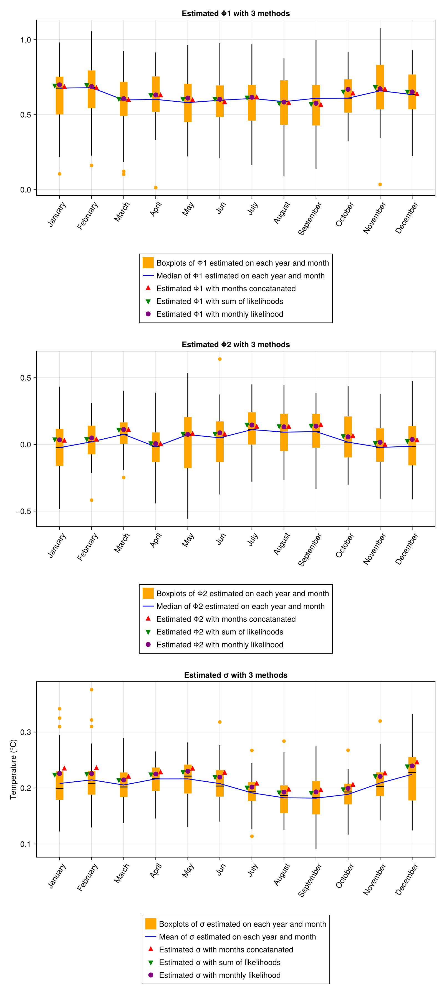

CairoMakie.Screen{IMAGE}


In [11]:
include("../utils/Estimation.jl")
Params, figure= AllEstimation(x, 2, Date_vec=series.DATE, lineplot=true)
display(figure)

In [12]:
params2 = TakeParameters(Params,"monthlyLL")

([[0.6988314064726865, 0.034235645519735264], [0.687574835279202, 0.0484466301116535], [0.6066237092065688, 0.11213618475609989], [0.6313468656030496, 0.00626458194242593], [0.6104804427801749, 0.07540119507651334], [0.60215297996505, 0.08670948889812681], [0.6160232514536195, 0.14539654829905618], [0.5836370764540102, 0.13158232173602208], [0.5753299412704456, 0.13699179715869794], [0.6684332840789678, 0.056690897953994394], [0.6722416835479795, 0.0159959081710602], [0.6511565425375588, 0.03699498095120839]], [0.22592954845852456, 0.22565574922475548, 0.21453386787977047, 0.22504369466538102, 0.22995591106394084, 0.219460015711909, 0.20166384597975706, 0.19263628670411204, 0.19299619381289107, 0.1992763856366367, 0.2206652127130164, 0.23948661149475142])

In [18]:
include(raw"..\utils\Structure.jl")
model_ = fit_MonthlyAR(series[:, 2], series.DATE, p = 2)
display(model_.Φ)
display(model_.σ)
model_.nspart == period

12-element RowSlices{Matrix{Float64}, Tuple{Base.OneTo{Int64}}, SubArray{Float64, 1, Matrix{Float64}, Tuple{Int64, Base.Slice{Base.OneTo{Int64}}}, true}}:
 [0.6988314064726865, 0.034235645519735264]
 [0.687574835279202, 0.0484466301116535]
 [0.6066237092065688, 0.11213618475609989]
 [0.6313468656030496, 0.00626458194242593]
 [0.6104804427801749, 0.07540119507651334]
 [0.60215297996505, 0.08670948889812681]
 [0.6160232514536195, 0.14539654829905618]
 [0.5836370764540102, 0.13158232173602208]
 [0.5753299412704456, 0.13699179715869794]
 [0.6684332840789678, 0.056690897953994394]
 [0.6722416835479795, 0.0159959081710602]
 [0.6511565425375588, 0.03699498095120839]

12-element Vector{Float64}:
 0.22592954845852456
 0.22565574922475548
 0.21453386787977047
 0.22504369466538102
 0.22995591106394084
 0.219460015711909
 0.20166384597975706
 0.19263628670411204
 0.19299619381289107
 0.1992763856366367
 0.2206652127130164
 0.23948661149475142

true

### Estimation and simulation with monthly likelihoods

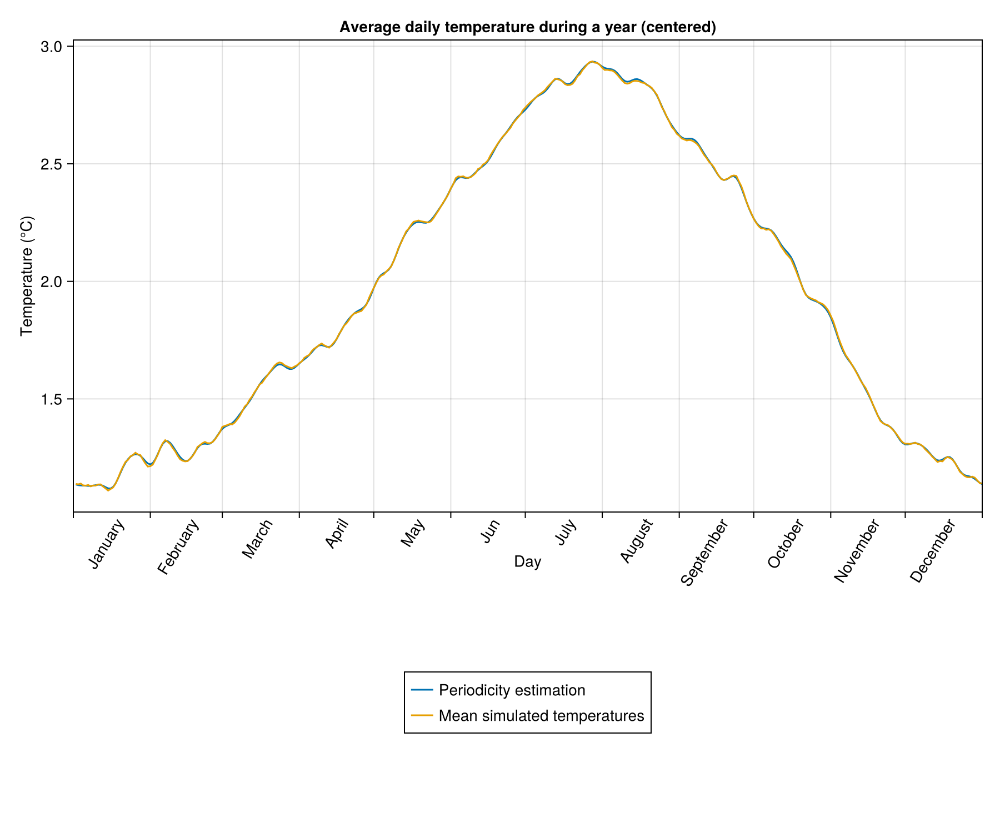

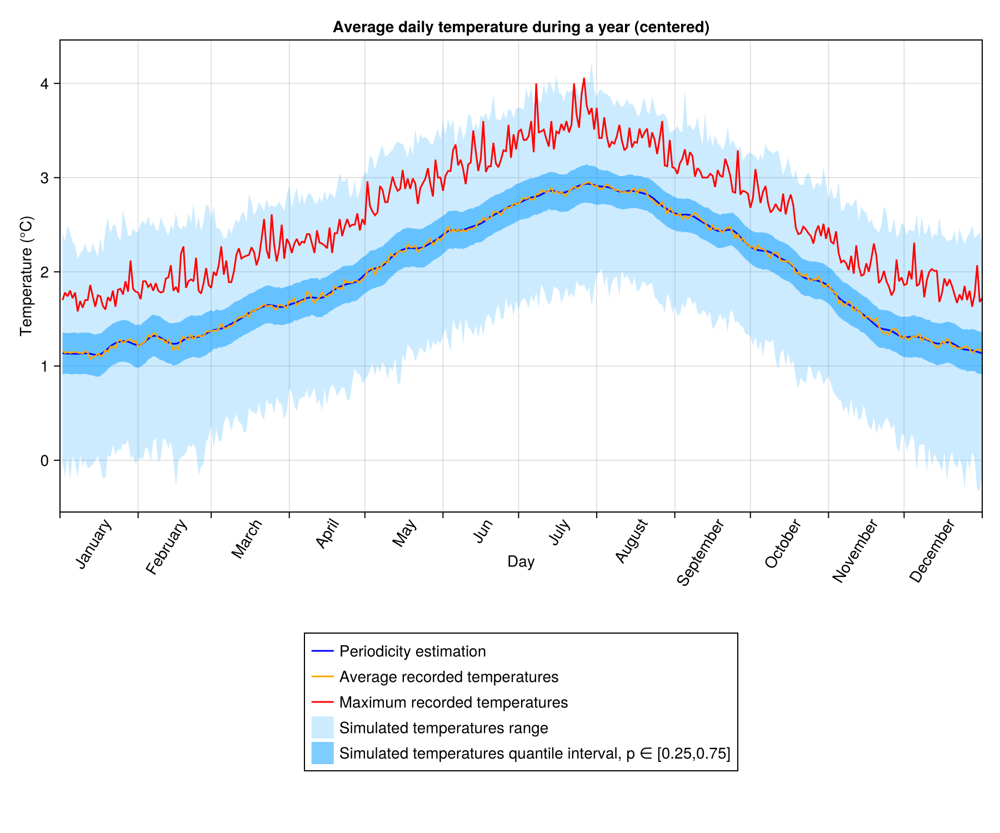

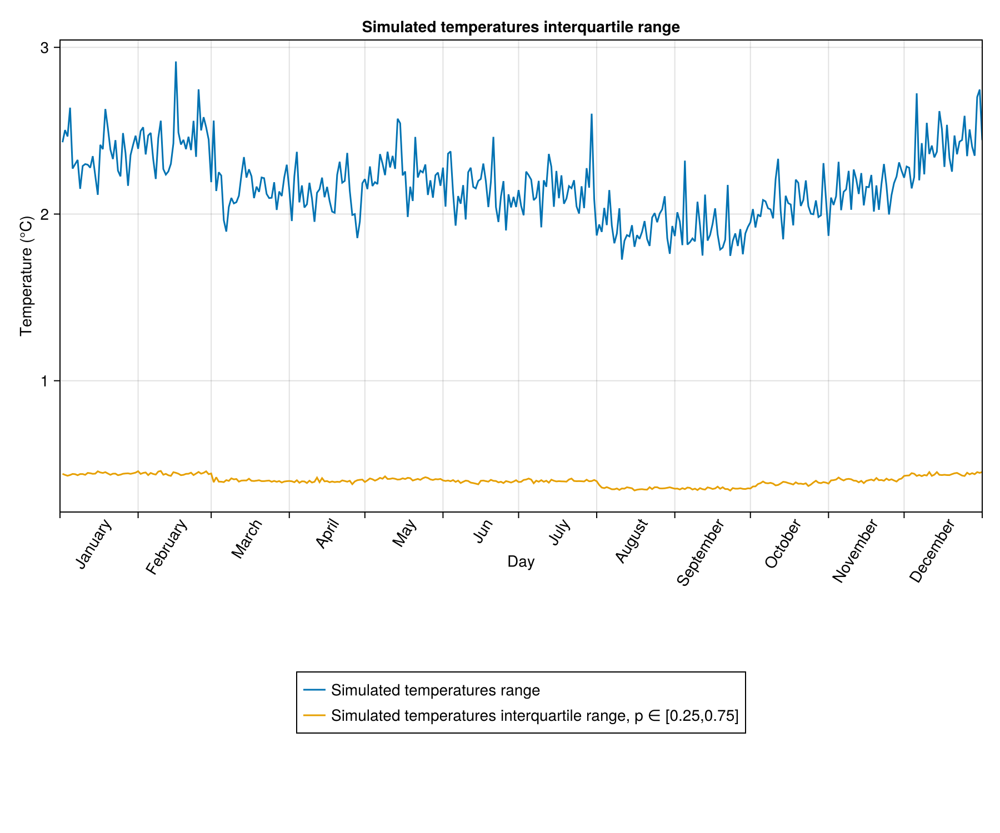

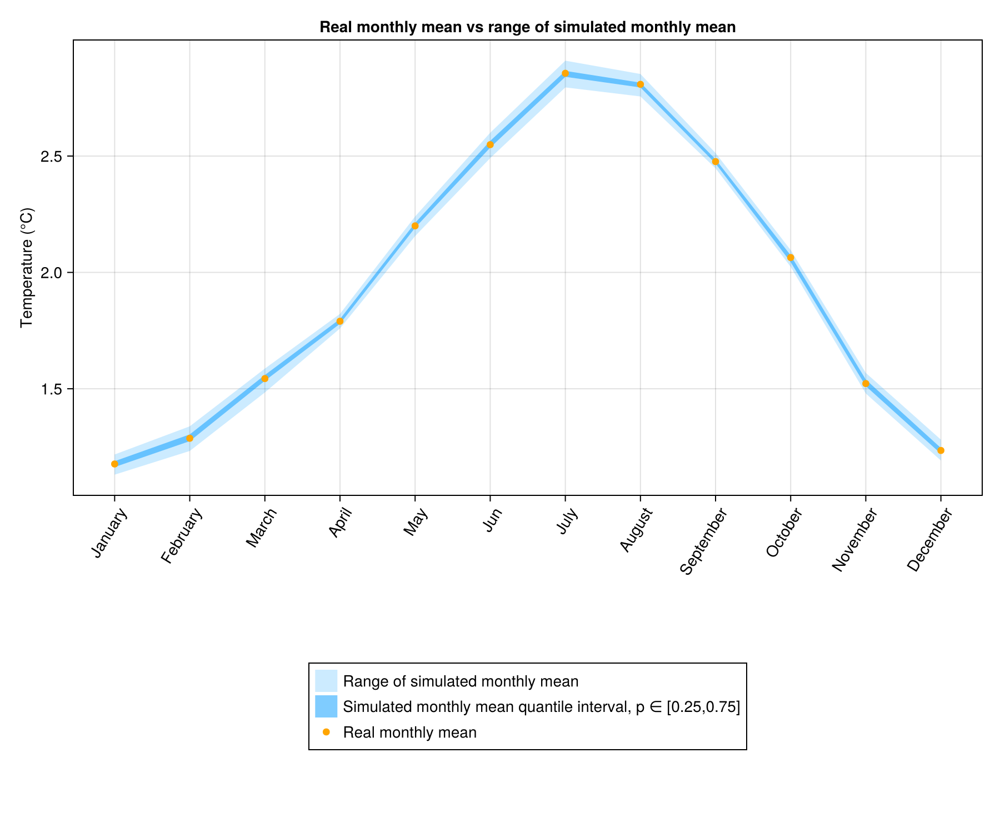

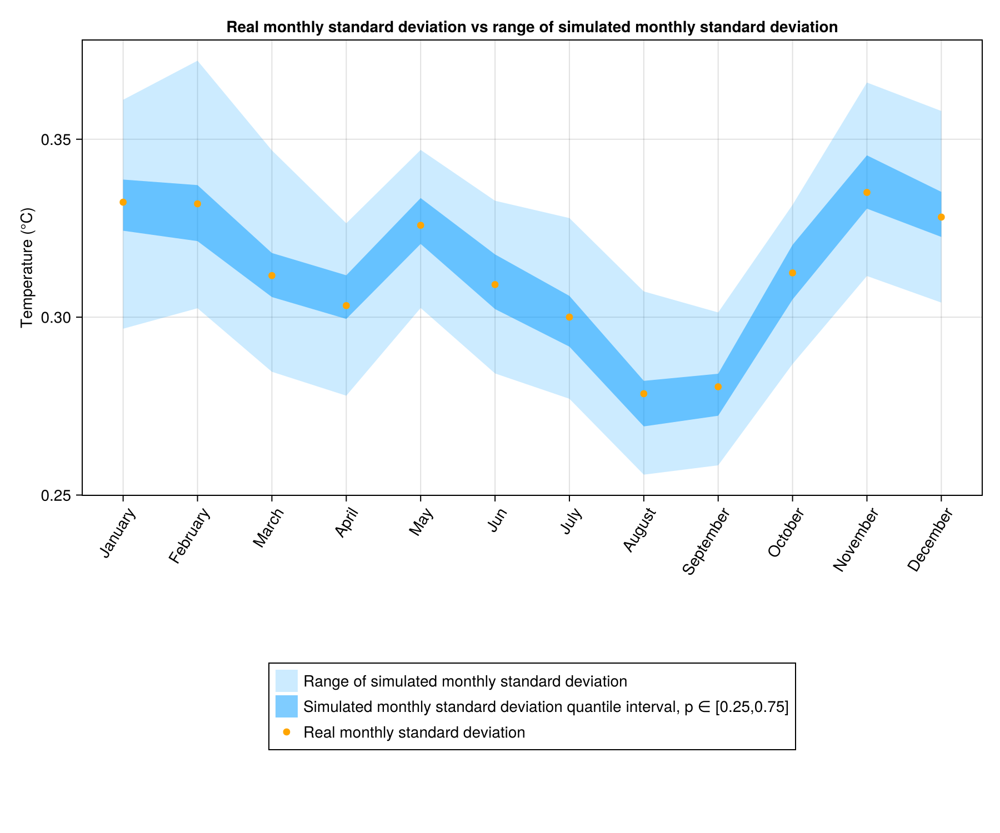

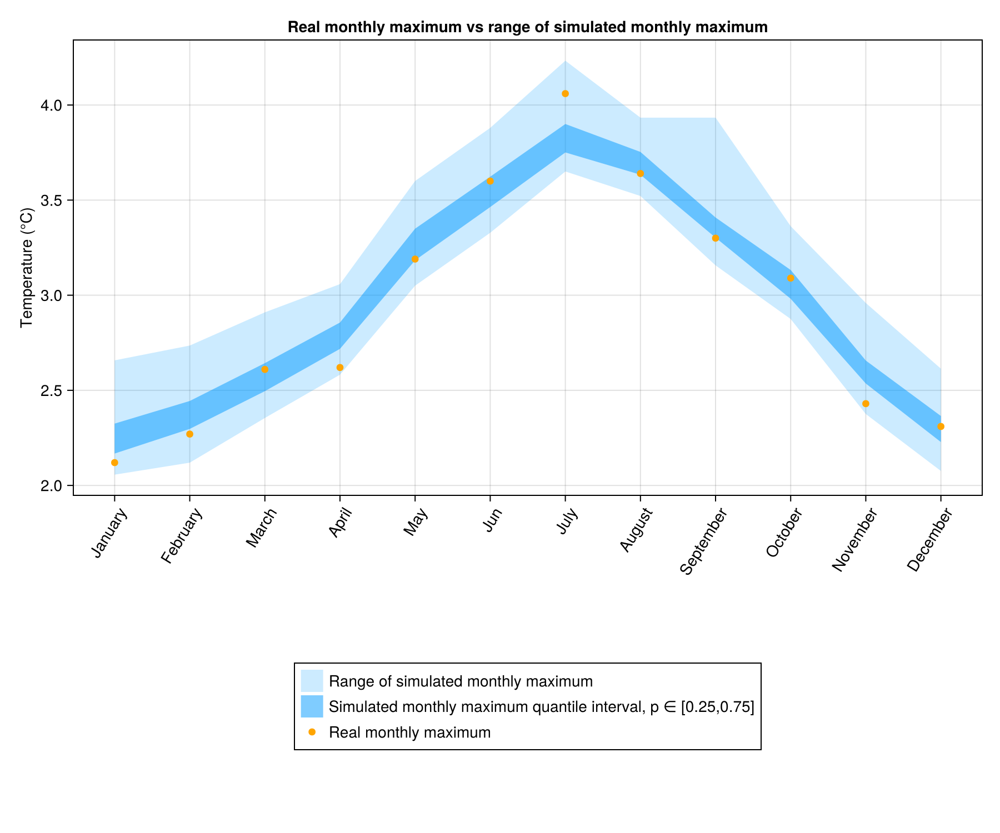

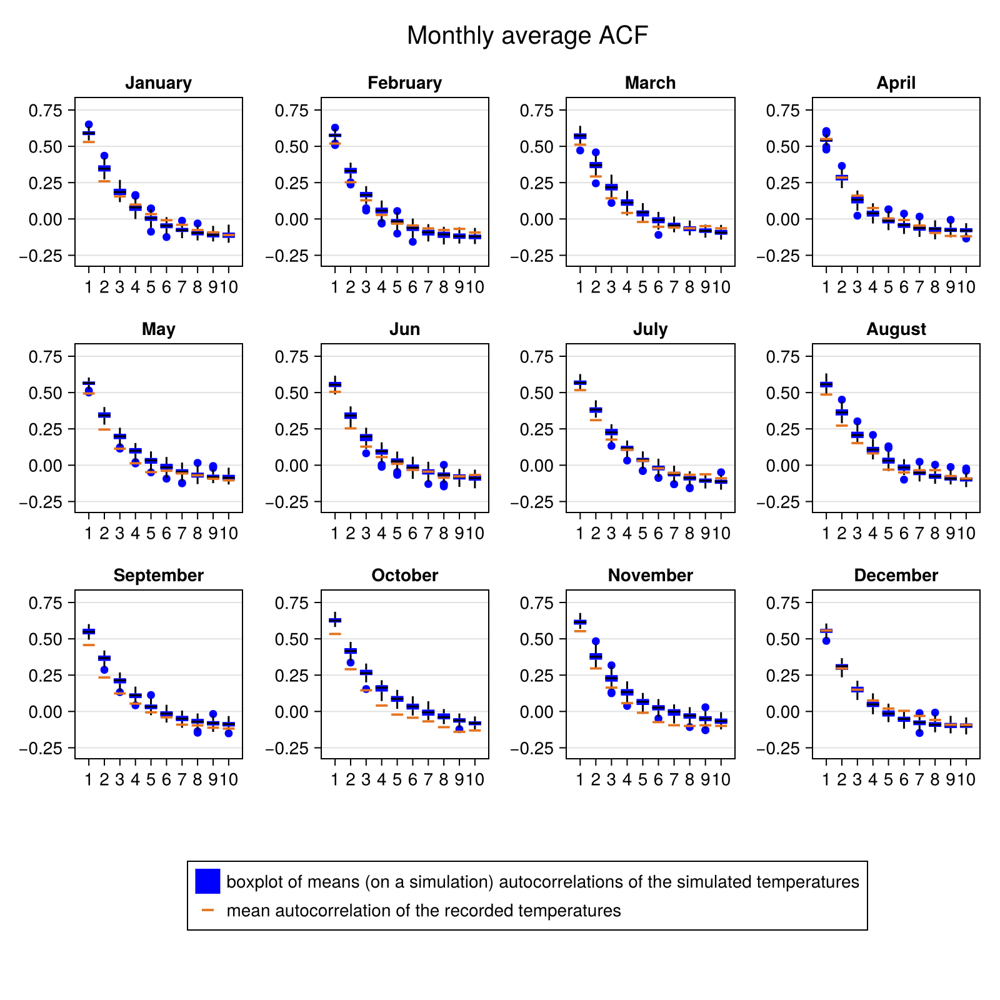

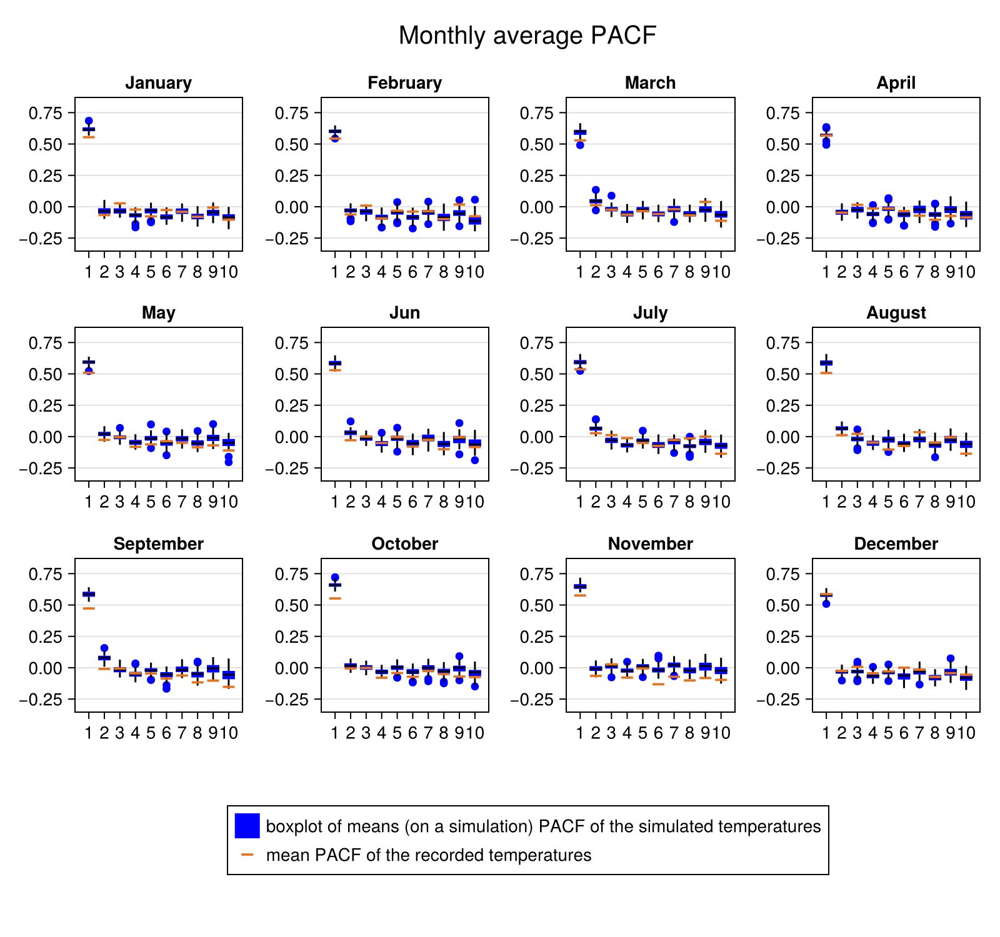

CairoMakie.Screen{IMAGE}


In [19]:
Φ_month_mean,σ_month_mean=TakeParameters(Params,"monthlyLL")
sample_ = SimulateScenarios(Monthly_temp[1][1][1:2],series.DATE[1]:series.DATE[end],Φ_month_mean,σ_month_mean,period,n=100)
year_sample = GatherYearScenarios(sample_,series.DATE[1]:series.DATE[end])
display(PlotYearCurves([period,mean.(year_sample)],["Periodicity estimation","Mean simulated temperatures"],"Average daily temperature during a year (centered)"))
display(PlotYearCurves([period,avg_day,max_day],
["Periodicity estimation","Average recorded temperatures","Maximum recorded temperatures","Simulated temperatures range","Simulated temperatures quantile interval, p ∈ [0.25,0.75]"],
"Average daily temperature during a year (centered)",
[(minimum.(year_sample),maximum.(year_sample)),(quantile.(year_sample,0.25),quantile.(year_sample,0.75))],
[("#009bff",0.2),("#009bff",0.5)],
colors=["blue","orange","red"]
))
display(PlotYearCurves([maximum.(year_sample) .- minimum.(year_sample) , quantile.(year_sample,0.75) .- quantile.(year_sample,0.25)],
["Simulated temperatures range" ,"Simulated temperatures interquartile range, p ∈ [0.25,0.75]"],
"Simulated temperatures interquartile range"
))
display.(WrapPlotMonthlyStats(df_month, sample_, series.DATE[1]:series.DATE[end]))
display(Plot_Sample_MonthlyACF(sample_,series.DATE[1]:series.DATE[end],Monthly_temp))
display(Plot_Sample_MonthlyPACF(sample_,series.DATE[1]:series.DATE[end],Monthly_temp))

In [20]:
mean(Error_MonthlyACF(sample_,series.DATE[1]:series.DATE[end],Monthly_temp))

0.048920529338884654

In [21]:
MPACF=Error_MonthlyPACF(sample_,series.DATE[1]:series.DATE[end],Monthly_temp)
display(mean(MPACF[1,:]))
display(mean(MPACF[2,:]))

0.044330415096708674

0.042221893502609624

L'AR1 semble légérement mieux que l'AR2 car les différences d'ACF avec les données réels sont légérement plus faible. Mais les différences entre les deux possibilités sont assez faibles.

# Test to see if Rand() works to simulate scenarios 

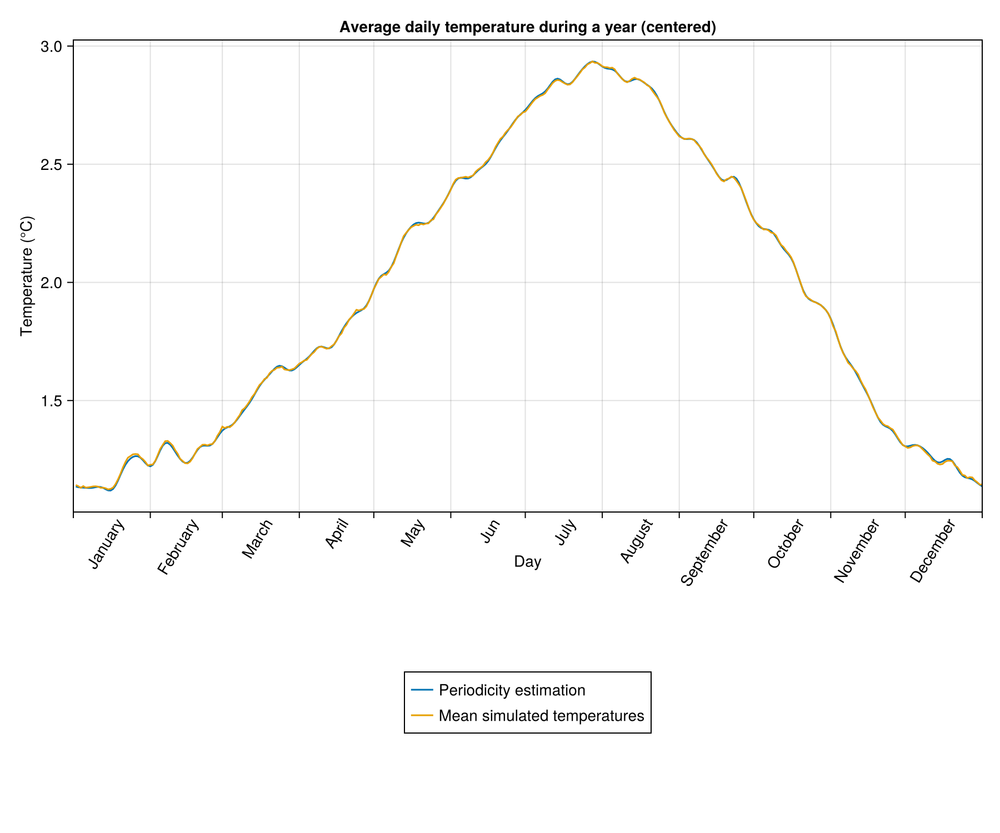

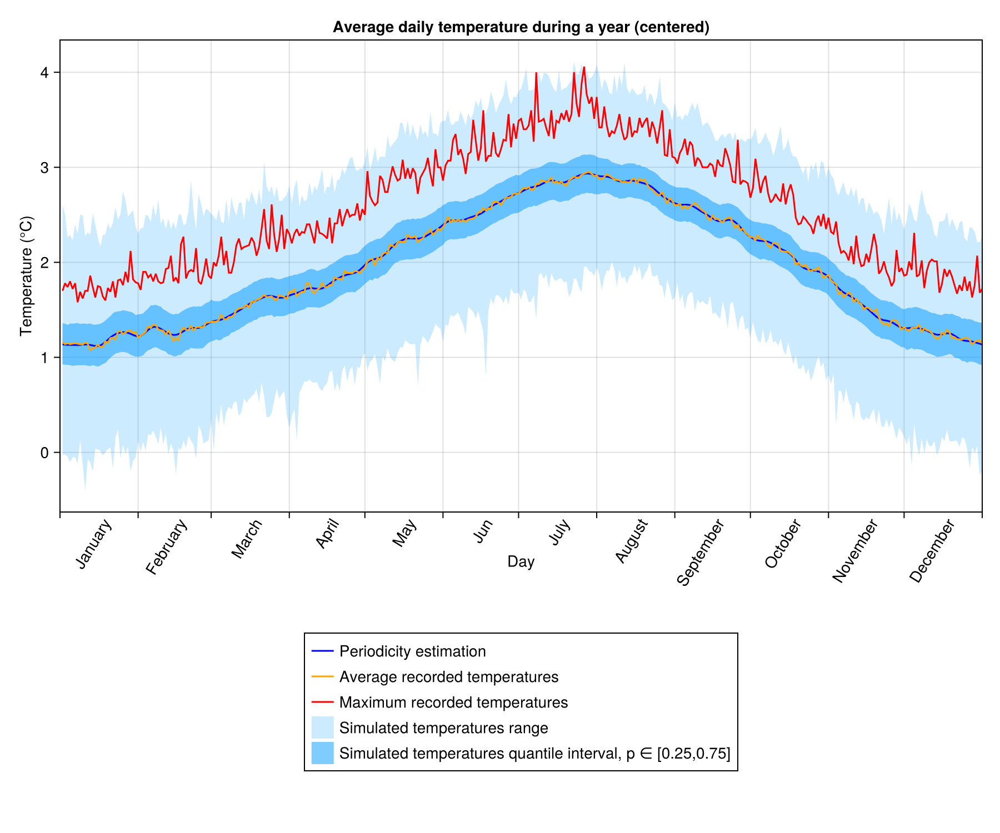

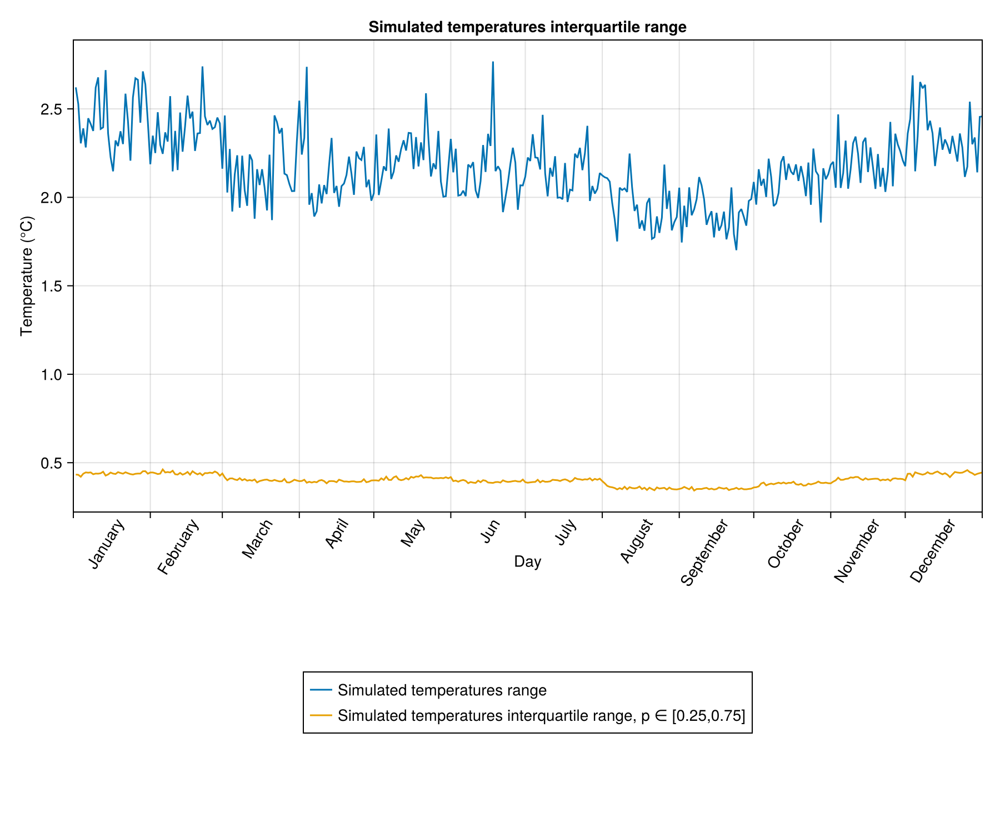

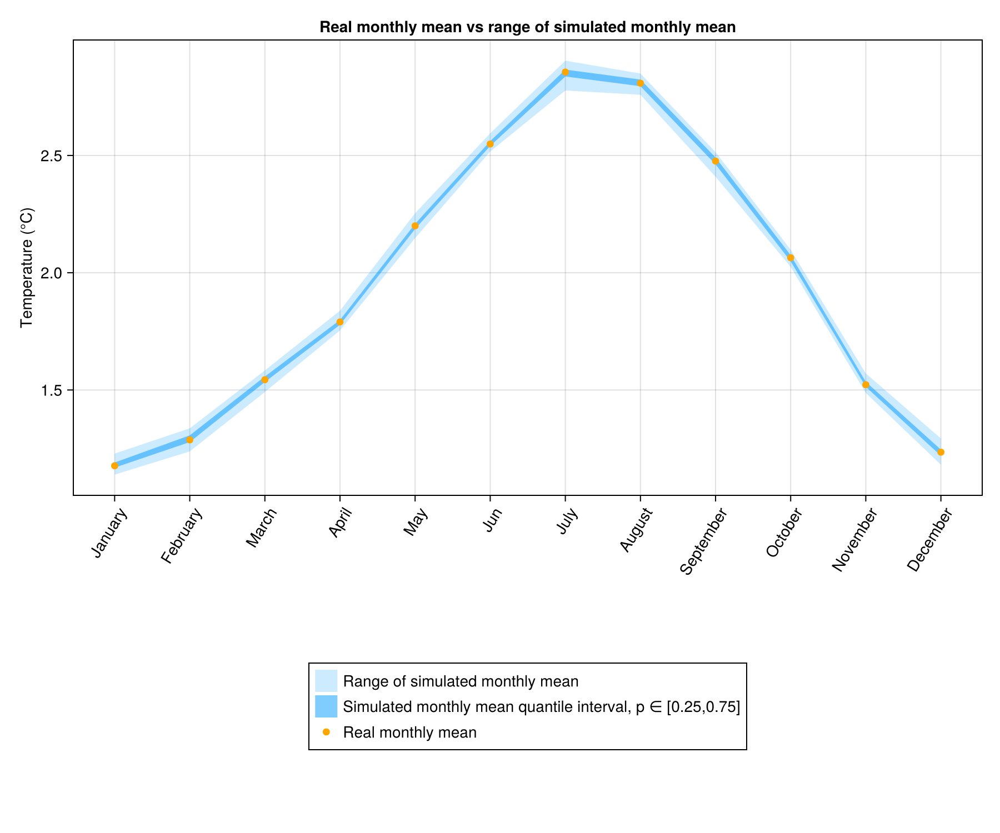

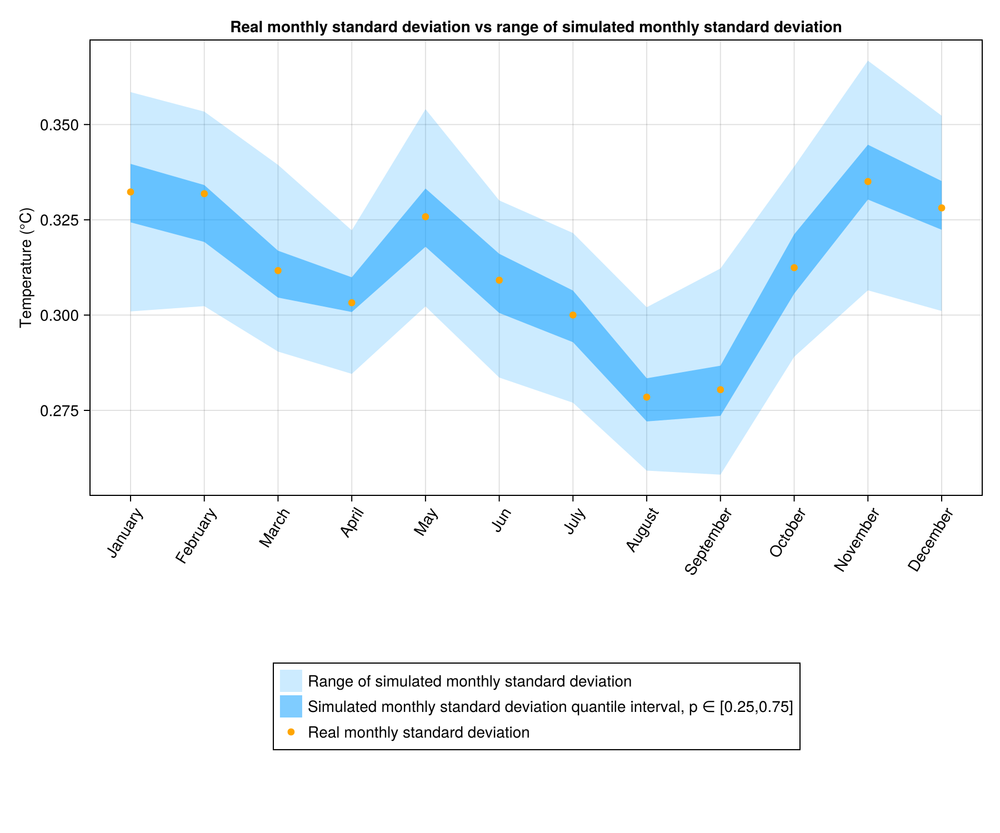

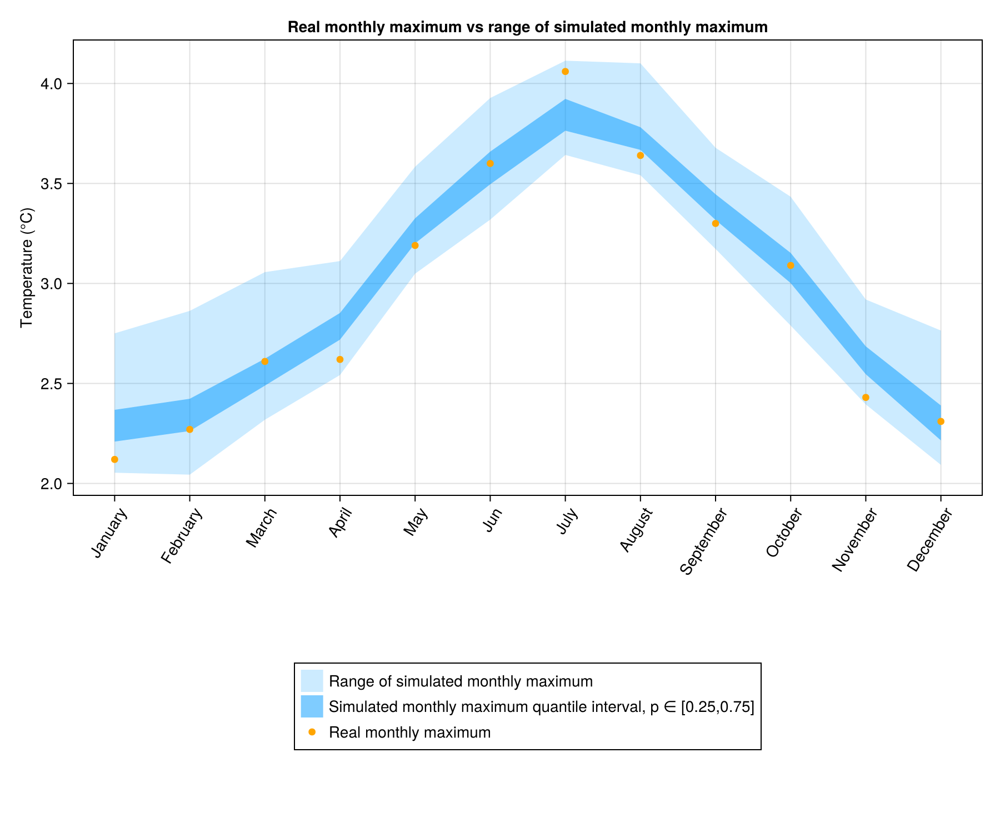

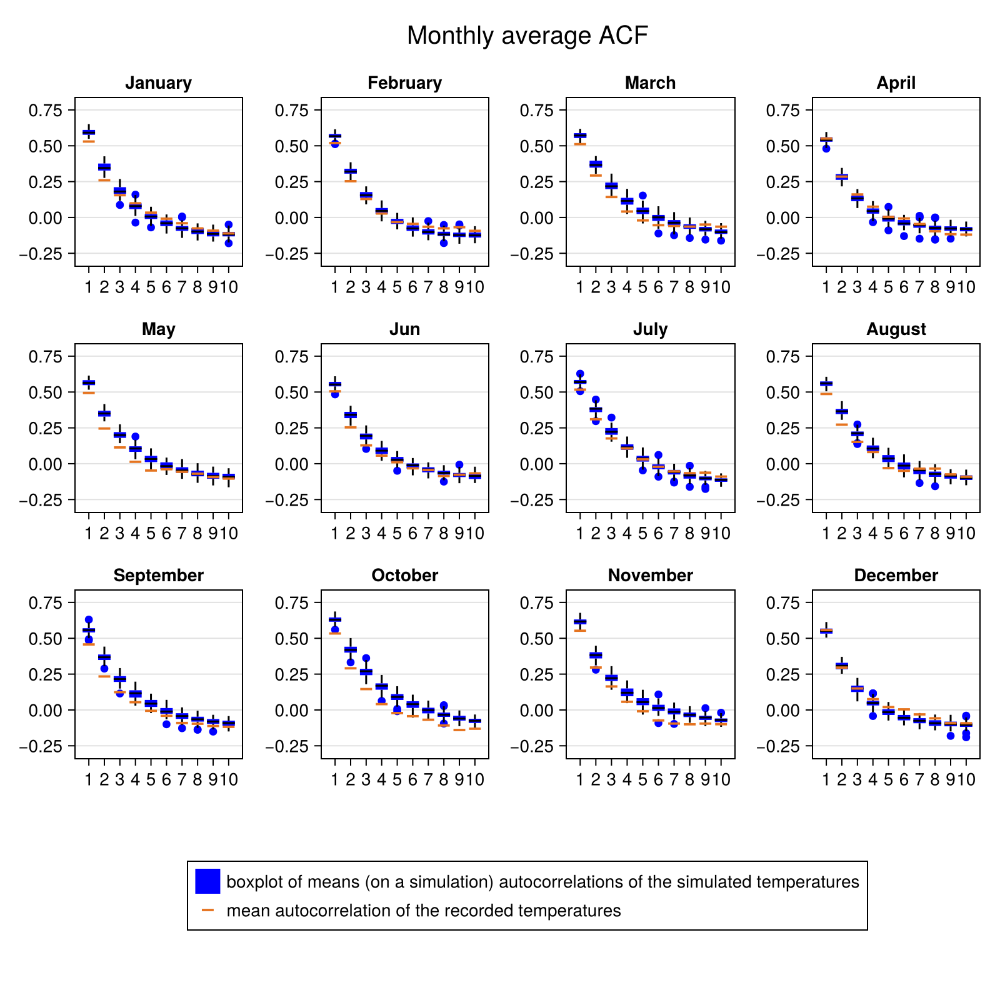

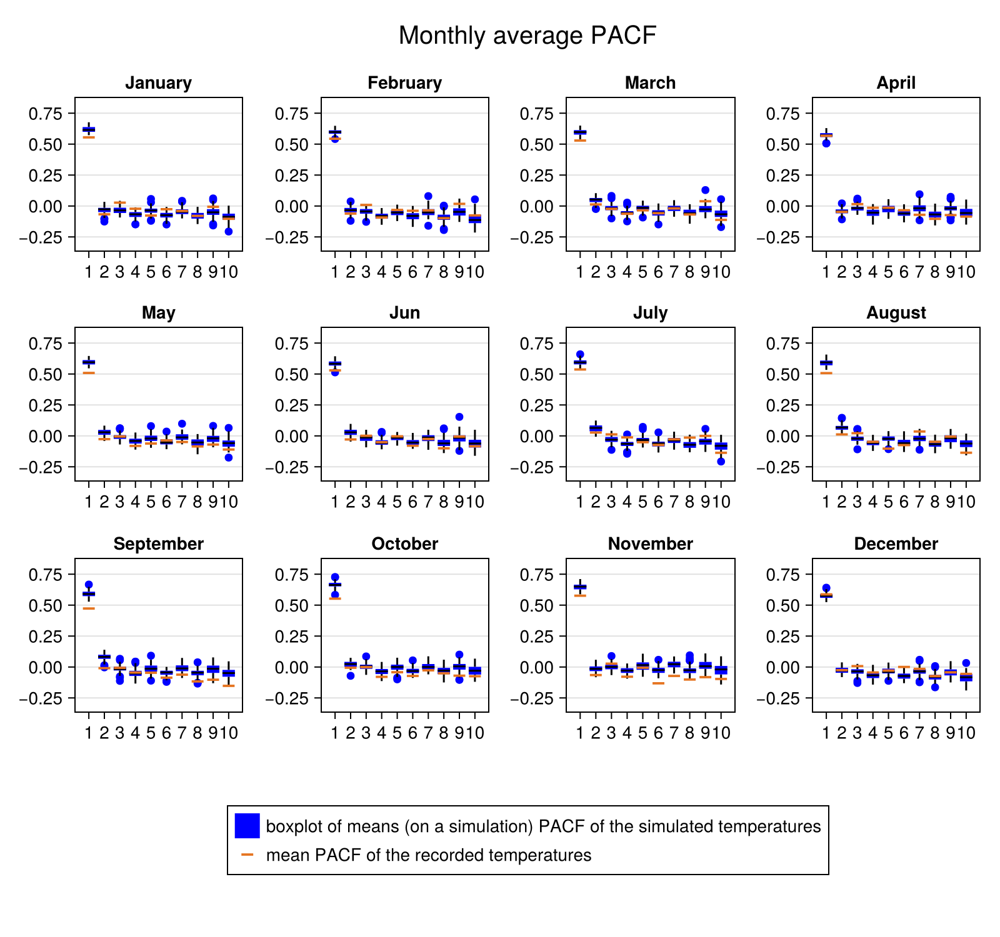

CairoMakie.Screen{IMAGE}


In [24]:
sample_ = rand(model_,series.DATE[1]:series.DATE[end],100)
year_sample = GatherYearScenarios(sample_,series.DATE[1]:series.DATE[end])
display(PlotYearCurves([period,mean.(year_sample)],["Periodicity estimation","Mean simulated temperatures"],"Average daily temperature during a year (centered)"))
display(PlotYearCurves([period,avg_day,max_day],
["Periodicity estimation","Average recorded temperatures","Maximum recorded temperatures","Simulated temperatures range","Simulated temperatures quantile interval, p ∈ [0.25,0.75]"],
"Average daily temperature during a year (centered)",
[(minimum.(year_sample),maximum.(year_sample)),(quantile.(year_sample,0.25),quantile.(year_sample,0.75))],
[("#009bff",0.2),("#009bff",0.5)],
colors=["blue","orange","red"]
))
display(PlotYearCurves([maximum.(year_sample) .- minimum.(year_sample) , quantile.(year_sample,0.75) .- quantile.(year_sample,0.25)],
["Simulated temperatures range" ,"Simulated temperatures interquartile range, p ∈ [0.25,0.75]"],
"Simulated temperatures interquartile range"
))
display.(WrapPlotMonthlyStats(df_month, sample_, series.DATE[1]:series.DATE[end]))
display(Plot_Sample_MonthlyACF(sample_,series.DATE[1]:series.DATE[end],Monthly_temp))
display(Plot_Sample_MonthlyPACF(sample_,series.DATE[1]:series.DATE[end],Monthly_temp))